In [1]:
from sklearn.svm import SVC
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False

In [2]:
#回归问题评价指标
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
#分类问题评价指标
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import log_loss#对数损失（交叉熵损失）

In [3]:
data=pd.read_excel('FTIR.xlsx',index_col=0)
X=data.iloc[:,:-1].values
y=data.iloc[:,-1].values
columns=data.iloc[:,:-1].columns.values


In [4]:
# 将数据分为训练集、验证集和测试集
from sklearn.model_selection import train_test_split

# 第一次划分：70%训练集，30%为临时集（包含验证集和测试集）
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=123)

# 第二次划分：从临时集中划分出验证集和测试集（1:2的比例）
# 30% * (1/3) = 10% 验证集
# 30% * (2/3) = 20% 测试集
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=123)

# 打印各个数据集的形状
print('X_train.shape:', X_train.shape)
print('y_train.shape:', y_train.shape)
print('X_val.shape:', X_val.shape)
print('y_val.shape:', y_val.shape)
print('X_test.shape:', X_test.shape)
print('y_test.shape:', y_test.shape)

X_train.shape: (126, 3351)
y_train.shape: (126,)
X_val.shape: (18, 3351)
y_val.shape: (18,)
X_test.shape: (36, 3351)
y_test.shape: (36,)


In [5]:
#定义函数计算评价指标
def calculate_metrics_two(y_true,y_pred):#二分类
    accuracy=accuracy_score(y_true,y_pred)
    sensitivity=recall_score(y_true,y_pred)#敏感性（召回率）
    specificity=confusion_matrix(y_true,y_pred)[0,0]/(confusion_matrix(y_true,y_pred)[0,0]+confusion_matrix(y_true,y_pred)[0,1])
    positive_predictive_values=precision_score(y_true,y_pred)
    negative_predictive_value=confusion_matrix(y_true,y_pred)[1,1]/(confusion_matrix(y_true,y_pred)[1,1]+confusion_matrix(y_true,y_pred)[1,0])
    f1=f1_score(y_true,y_pred)
    kappa=cohen_kappa_score(y_true,y_pred)
    return [accuracy,sensitivity,specificity,positive_predictive_values,negative_predictive_value,f1,kappa]

def calculate_metrics_multi(y_true,y_pred):#多分类
    accuracy=accuracy_score(y_true,y_pred)
    precision=precision_score(y_true,y_pred,average='macro')
    recall=recall_score(y_true,y_pred,average='macro')
    f1=f1_score(y_true,y_pred,average='macro')
    kappa=cohen_kappa_score(y_true,y_pred)
    return [accuracy,precision,recall,f1,kappa]

In [6]:
# 创建SVM分类器对象
svc = SVC(random_state=42)

param_distributions = {
    'C': [0.001,0.01,0.1,1,10,100],  # 正则化参数
    'gamma': [0.001,0.01,0.1,1,10,100],  # 核函数参数
    'kernel': ['linear', 'rbf', 'sigmoid','poly'],  # 核函数类型    #注poly核函数跑的话特别消耗时间
}

random_search = RandomizedSearchCV(svc, param_distributions, n_iter=10, cv=5,verbose=3)

random_search.fit(X_train,y_train)

#获取最佳参数
best_params=random_search.best_params_
print("随机搜索的最佳参数：",best_params)

best_model = random_search.best_estimator_
 
y_pred_train = best_model.predict(X_train) 
y_pred_val = best_model.predict(X_val)
y_pred_test = best_model.predict(X_test)

[accuracy_train,precision_train,recall_train,f1_train,kappa_train]=calculate_metrics_multi(y_pred_train,y_train) 
[accuracy_val,precision_val,recall_val,f1_val,kappa_val]=calculate_metrics_multi(y_pred_val,y_val)
[accuracy_test,precision_test,recall_test,f1_test,kappa_test]=calculate_metrics_multi(y_pred_test,y_test) 
print("训练集准确率",accuracy_train) 
print("训练集精确率",precision_train) 
print("训练集召回率：",recall_train) 
print("训练集F1分数：",f1_train) 
print("训练集Kappa系数：",kappa_train) 

print("验证集准确率：",accuracy_val)
print("验证集精确率",precision_val)
print("验证集召回率",recall_val)
print("验证集F1分数：",f1_val)
print("验证集Kappa系数：",kappa_val)

print("测试集准确率：",accuracy_test) 
print("测试集精确率",precision_test) 
print("测试集召回率",recall_test) 
print("测试集F1分数：",f1_test) 
print("测试集Kappa系数：",kappa_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END .C=100, gamma=0.01, kernel=sigmoid;, score=0.692 total time=   0.0s
[CV 2/5] END .C=100, gamma=0.01, kernel=sigmoid;, score=0.760 total time=   0.0s
[CV 3/5] END .C=100, gamma=0.01, kernel=sigmoid;, score=0.760 total time=   0.0s
[CV 4/5] END .C=100, gamma=0.01, kernel=sigmoid;, score=0.760 total time=   0.0s
[CV 5/5] END .C=100, gamma=0.01, kernel=sigmoid;, score=0.880 total time=   0.0s
[CV 1/5] END .C=0.1, gamma=0.01, kernel=sigmoid;, score=0.346 total time=   0.0s
[CV 2/5] END .C=0.1, gamma=0.01, kernel=sigmoid;, score=0.360 total time=   0.0s
[CV 3/5] END .C=0.1, gamma=0.01, kernel=sigmoid;, score=0.360 total time=   0.0s
[CV 4/5] END .C=0.1, gamma=0.01, kernel=sigmoid;, score=0.360 total time=   0.0s
[CV 5/5] END .C=0.1, gamma=0.01, kernel=sigmoid;, score=0.320 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=10, kernel=linear;, score=0.731 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=10, kernel=linear;

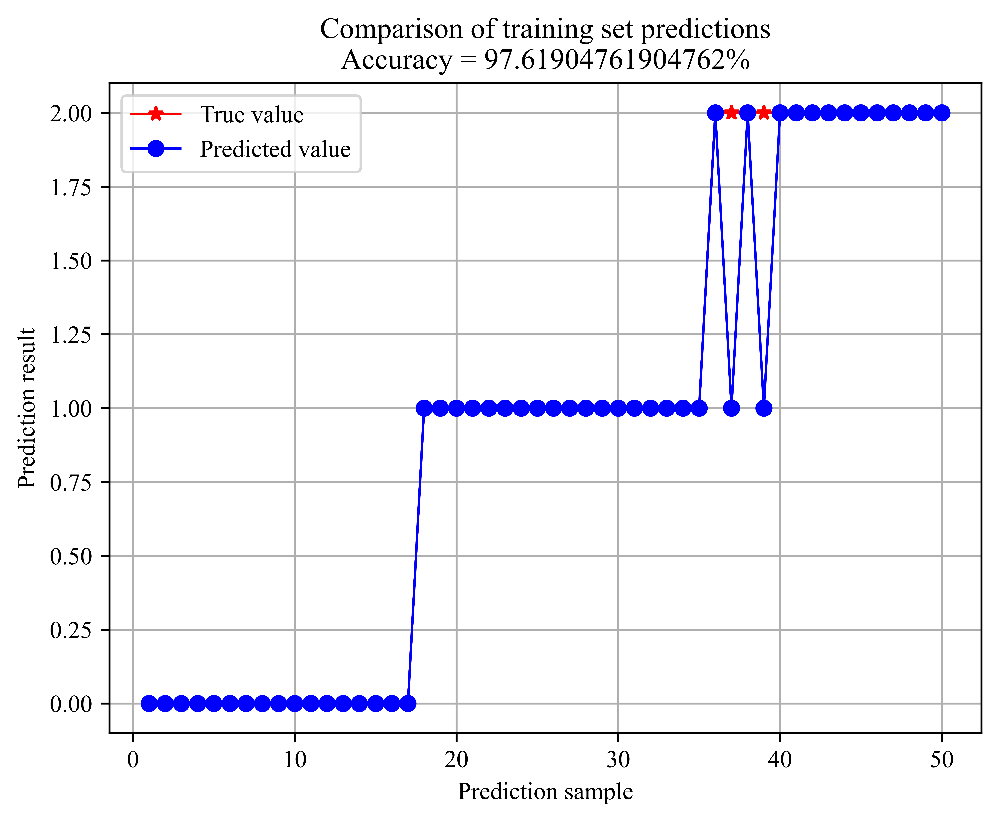

In [7]:
N = len(y_train)
index_50_train=np.random.choice(range(0, N), 50, replace=True)#随机挑选50个样本出来，样本太多不好显示
y_train_=y_train[index_50_train]
y_train_pred_=y_pred_train[index_50_train]

index_train = np.argsort(y_train_)
y_train_sort = np.sort(y_train_)

y_pred_train_sort = np.array(y_train_pred_)[index_train]

plt.figure( dpi=1200)

plt.rcParams["font.family"] = "Times New Roman"

# 绘制真实值曲线
plt.plot(np.arange(1, 50+1), y_train_sort, 'r-*', label='True value', linewidth=1)

# 绘制预测值曲线
plt.plot(np.arange(1, 50+1), y_pred_train_sort, 'b-o', label='Predicted value', linewidth=1)

# 添加图例
plt.legend()

# 设置x轴标签
plt.xlabel('Prediction sample')

# 设置y轴标签
plt.ylabel('Prediction result')

# 设置标题，将准确率信息添加到标题中
string = f"Comparison of training set predictions\nAccuracy = {accuracy_train*100}%"
plt.title(string)

# 添加网格
plt.grid()

# 显示图形
plt.show()

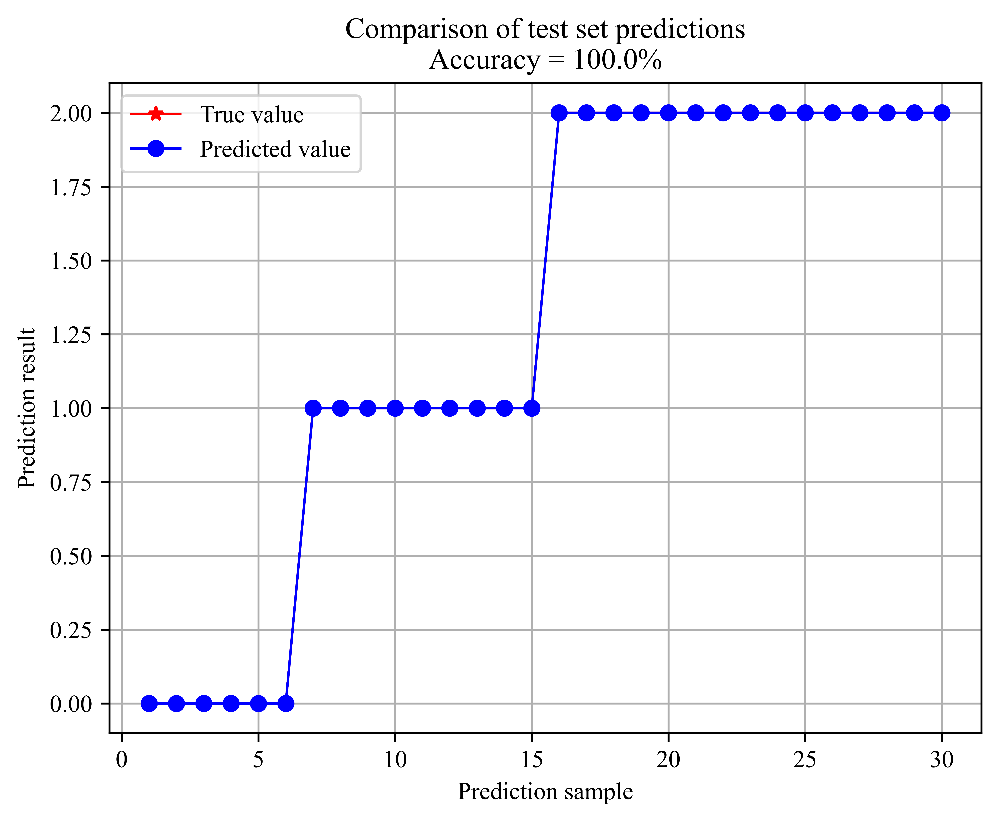

In [8]:
N = len(y_test)
index_30_test=np.random.choice(range(0, N), 30, replace=True)#随机挑选20个样本出来，样本太多不好显示
y_test_=y_test[index_30_test]
y_test_pred_=y_pred_test[index_30_test]

index_test= np.argsort(y_test_)
y_test_sort = np.sort(y_test_)

y_pred_test_sort = np.array(y_test_pred_)[index_test]

plt.figure( dpi=1200)

plt.rcParams["font.family"] = "Times New Roman"

# 绘制真实值曲线
plt.plot(np.arange(1, 30 + 1), y_test_sort, 'r-*', label='True value', linewidth=1)

# 绘制预测值曲线
plt.plot(np.arange(1, 30 + 1), y_pred_test_sort, 'b-o', label='Predicted value', linewidth=1)

# 添加图例
plt.legend()

# 设置x轴标签
plt.xlabel('Prediction sample')

# 设置y轴标签
plt.ylabel('Prediction result')

# 设置标题，将准确率信息添加到标题中
string = f"Comparison of test set predictions\nAccuracy = {accuracy_test*100}%"
plt.title(string)

# 添加网格
plt.grid()

# 显示图形
plt.show()

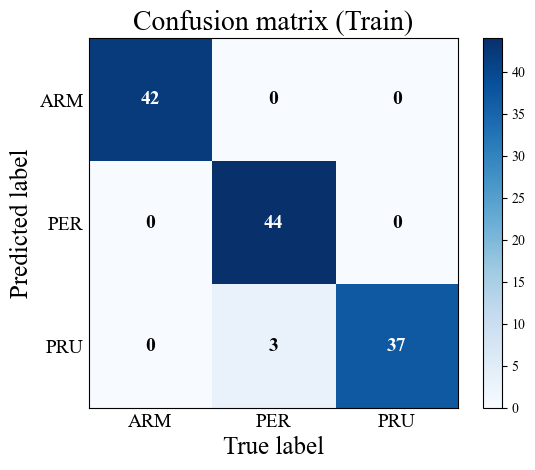

In [9]:
import scikitplot as skplt
mapping = { 0: 'ARM',   1: 'PER',2: 'PRU'} 

y_train_map= [mapping[i] if i in mapping else i for i in y_train] 
y_pred_train_map = [mapping[i] if i in mapping else i for i in np.array(y_pred_train)] 
plot = skplt.metrics.plot_confusion_matrix(y_train_map, y_pred_train_map)

plt.tick_params(axis='both', which='both', length=0)  
plt.title('Confusion matrix (Train)', fontsize=20)
# 设置标题和轴标签，并修改字体大小
plt.xlabel("True label", fontsize=18)  # X轴标签字体大小
plt.ylabel("Predicted label", fontsize=18)  # Y轴标签字体大小
# 调整刻度标签的字体大小
plt.xticks(fontsize=14)  # X轴刻度标签字体大小
plt.yticks(fontsize=14)  # Y轴刻度标签字体大小
# 调整单元格内数字的字体大小
for text in plot.texts:
    text.set_fontsize(14)  
    text.set_fontweight("bold")  # 如果要加粗

plt.savefig('SVM.png', dpi=1200, bbox_inches='tight') 
plt.show()

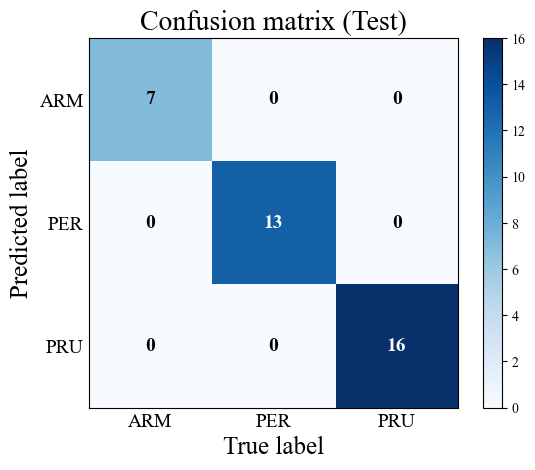

In [10]:
import scikitplot as skplt
mapping = { 0: 'ARM',   1: 'PER',2: 'PRU'} 

y_test_map= [mapping[i] if i in mapping else i for i in y_test] 
y_pred_test_map = [mapping[i] if i in mapping else i for i in np.array(y_pred_test)] 
plot = skplt.metrics.plot_confusion_matrix(y_test_map, y_pred_test_map)

plt.tick_params(axis='both', which='both', length=0)  
plt.title('Confusion matrix (Test)', fontsize=20)
# 设置标题和轴标签，并修改字体大小
plt.xlabel("True label", fontsize=18)  # X轴标签字体大小
plt.ylabel("Predicted label", fontsize=18)  # Y轴标签字体大小
# 调整刻度标签的字体大小
plt.xticks(fontsize=14)  # X轴刻度标签字体大小
plt.yticks(fontsize=14)  # Y轴刻度标签字体大小
# 调整单元格内数字的字体大小
for text in plot.texts:
    text.set_fontsize(14)  
    text.set_fontweight("bold")  # 如果要加粗

plt.savefig('SVM.png', dpi=800,bbox_inches='tight') 
plt.show()

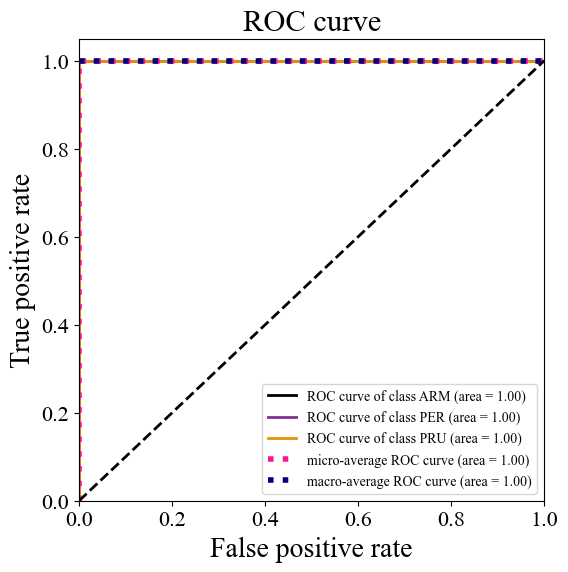

In [11]:
y_pred_proba=best_model.decision_function(X_test)

#'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Grays', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_grey', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gist_yerg', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'grey', 'hot', 'hot_r', 'hsv', 'hsv_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'winter', 'winter_r'
skplt.metrics.plot_roc(y_test_map, y_pred_proba,cmap='CMRmap')
plt.savefig('SVM roc.png', dpi=1200,bbox_inches='tight') 

plt.gcf().set_size_inches(6, 6)
# 设置标题和轴标签，并修改字体大小
plt.title("ROC curve", fontsize=22)  # 标题字体大小
plt.xlabel("False positive rate", fontsize=20)  # X轴标签字体大小
plt.ylabel("True positive rate", fontsize=20)  # Y轴标签字体大小
# 调整刻度标签的字体大小
plt.xticks(fontsize=16)  # X轴刻度标签字体大小
plt.yticks(fontsize=16)  # Y轴刻度标签字体大小
plt.show()


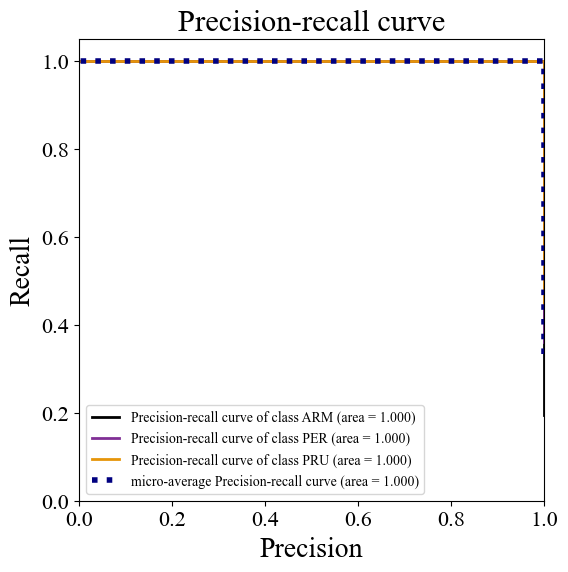

In [12]:
skplt.metrics.plot_precision_recall(y_test_map,y_pred_proba,cmap='CMRmap')
plt.savefig('SVM pr.png', dpi=800,bbox_inches='tight')
plt.gcf().set_size_inches(6, 6)
# 设置标题和轴标签，并修改字体大小
plt.title("Precision-recall curve", fontsize=22)  # 标题字体大小
plt.xlabel("Precision", fontsize=20)  # X轴标签字体大小
plt.ylabel("Recall", fontsize=20)  # Y轴标签字体大小
# 调整刻度标签的字体大小
plt.xticks(fontsize=16)  # X轴刻度标签字体大小
plt.yticks(fontsize=16)  # Y轴刻度标签字体大小
plt.show()

In [13]:
X_test_=pd.DataFrame(X_test.reshape(X_test.shape[0],-1),columns=columns)
X_test_.head()

,4000,3999,3998,3997,3996,3995,3994,3993,3992,3991,...,659,658,657,656,655,654,653,652,651,650
0,0.0145,0.0145,0.0145,0.0145,0.0146,0.0146,0.0145,0.0145,0.0145,0.0145,...,0.2957,0.2958,0.2962,0.2971,0.2980,0.2987,0.2992,0.2999,0.3005,0.3007
1,0.0021,0.0021,0.0021,0.0021,0.0021,0.0021,0.0021,0.0022,0.0022,0.0022,...,0.2807,0.2804,0.2804,0.2814,0.2824,0.2825,0.2829,0.2843,0.2853,0.2854
2,0.0048,0.0048,0.0048,0.0048,0.0048,0.0048,0.0048,0.0048,0.0048,0.0048,...,0.2642,0.2645,0.2647,0.2651,0.2654,0.2655,0.2658,0.2665,0.2673,0.2678
3,0.0018,0.0018,0.0018,0.0018,0.0018,0.0018,0.0017,0.0017,0.0017,0.0018,...,0.2527,0.2525,0.2525,0.2530,0.2535,0.2536,0.2538,0.2546,0.2553,0.2557
4,0.0062,0.0061,0.0061,0.0061,0.0062,0.0062,0.0062,0.0062,0.0061,0.0061,...,0.2530,0.2535,0.2540,0.2546,0.2551,0.2553,0.2556,0.2562,0.2569,0.2574


In [14]:
import shap

explainer = shap.KernelExplainer(best_model.decision_function, X_test_.iloc[:50,:]) 

# 计算 SHAP 值
shap_values = explainer.shap_values(X_test_)

# 计算shap值为Explanation格式
shap_values_Explanation = explainer(X_test_)

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


  0%|          | 0/36 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
# 特征标签
labels = columns

# 设置 matplotlib 的全局字体配置
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['axes.unicode_minus'] = False

# 提取每个类别的 SHAP 值
shap_values_class_1 = shap_values[0].reshape(-1,3401)
shap_values_class_2 = shap_values[1].reshape(-1,3401)
shap_values_class_3 = shap_values[2].reshape(-1,3401)


import matplotlib.pyplot as plt
import shap
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable

# 创建主图（用来画蜂巢图）
fig, ax1 = plt.subplots(figsize=(10, 8), dpi=1200)

# 计算每个特征的平均SHAP值
mean_shap_values = np.abs(shap_values_class_1).mean(0)
total_importance = mean_shap_values.sum()
percentages = (mean_shap_values / total_importance) * 100

# 创建特征名称和对应的数值
feature_importance_data = list(zip(columns, mean_shap_values, percentages))
# 按重要性排序
feature_importance_data.sort(key=lambda x: x[1], reverse=True)

# 绘制蜂巢图
shap.summary_plot(shap_values_class_1, X_test_.values.reshape(-1,3401), columns, plot_type="dot", show=False, color_bar=True,cmap='bwr')
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 调整图表位置，留出右侧空间



ax1 = plt.gca()

fig = plt.gcf()  # 获取当前Figure
ax_cbar = fig.axes[-1]  # 获取最后一个轴（颜色条）


# 创建共享 y 轴的另一个图，绘制特征贡献图在顶部x轴
ax2 = ax1.twiny()
shap.summary_plot(shap_values_class_1, X_test_.values.reshape(-1,3401), columns, plot_type="bar", show=False,color='black')
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 调整图表位置，与蜂巢图对齐

# 在顶部 X 轴添加一条横线
y_max = len(columns)
ax2.axhline(y=20, color='gray', linestyle='-', linewidth=1)

# 调整透明度
bars = ax2.patches  # 获取所有的柱状图对象
for bar in bars:
    bar.set_alpha(0.2)  # 设置透明度

# 移动顶部的 X 轴，避免与底部 X 轴重叠
ax2.xaxis.set_label_position('top')  # 将标签移动到顶部
ax2.xaxis.tick_top()  # 将刻度也移动到顶部

ax2.set_xlabel('Mean Shapley Value (Feature Importance)', fontsize=12)
# 在右侧添加平均SHAP值和百分比文本（按重要性排序）
# 获取当前图中特征的顺序（从上到下）
current_y_labels = [tick.get_text() for tick in ax1.get_yticklabels()]

# 为每个位置添加对应的数值和百分比
for i, feature_name in enumerate(current_y_labels):
    # 找到该特征在排序后数据中的信息
    feature_data = next((item for item in feature_importance_data if item[0] == feature_name), None)
    if feature_data:
        feature, mean_val, percentage = feature_data
        y_pos = i  # 当前特征在图中的y位置
        
        # 分别绘制SHAP值（蓝色）和百分比（红色）
        # 绘制SHAP值（蓝色）
        ax1.text(ax1.get_xlim()[1] * 0.95, y_pos + 0.18, f'{mean_val:.4f}', 
                 verticalalignment='center', fontsize=8, color='blue')
        
        # 绘制百分比（红色）
        ax1.text(ax1.get_xlim()[1] * 0.95, y_pos - 0.18, f'{percentage:.3f}%', 
                 verticalalignment='center', fontsize=8, color='red')
# 设置y轴标签
ax1.set_ylabel('Feature', fontsize=12)
plt.grid(False)
plt.tight_layout() 


# 保存图片
plt.savefig("SHAP_combined_with_values_and_percentages1.png", format='png', bbox_inches='tight', dpi=300)
plt.show()

# 打印特征重要性排序
print("\n特征重要性排序：")
print("特征名\t\t平均SHAP值\t百分比")
print("-" * 40)
for feature, mean_val, percentage in feature_importance_data:
    print(f"{feature}\t\t{mean_val:.4f}\t\t{percentage:.3f}%")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



特征重要性排序：
特征名		平均SHAP值	百分比
----------------------------------------
615		0.0188		0.546%
616		0.0168		0.488%
600		0.0154		0.446%
1049		0.0152		0.441%
1048		0.0149		0.434%
1050		0.0140		0.405%
614		0.0139		0.404%
1052		0.0139		0.402%
617		0.0133		0.386%
1046		0.0129		0.375%
613		0.0129		0.373%
611		0.0128		0.371%
612		0.0126		0.366%
601		0.0124		0.361%
1047		0.0124		0.359%
602		0.0123		0.357%
1045		0.0122		0.353%
603		0.0116		0.338%
1051		0.0116		0.337%
1054		0.0107		0.311%
610		0.0106		0.308%
1053		0.0104		0.301%
993		0.0104		0.300%
1055		0.0103		0.300%
618		0.0103		0.298%
1038		0.0096		0.278%
1042		0.0096		0.278%
1044		0.0096		0.278%
620		0.0095		0.276%
609		0.0095		0.274%
608		0.0095		0.274%
1056		0.0090		0.262%
1043		0.0087		0.253%
607		0.0087		0.251%
992		0.0086		0.251%
1063		0.0086		0.249%
619		0.0085		0.248%
1059		0.0085		0.246%
1036		0.0083		0.242%
604		0.0083		0.241%
1067		0.0081		0.236%
629		0.0080		0.232%
991		0.0078		0.226%
998		0.0077		0.225%
988		0.0077		0.225%
1058		0.0077

In [ ]:
def plot_nightingale_rose_with_bars(sorted_feature_names, sorted_shap_values, angle=90, add_colorbar=True):
    """
    绘制南丁格尔玫瑰图展示特征重要性，并添加水平柱状图和颜色条
    
    参数:
    sorted_feature_names: 排序后的特征名列表
    sorted_shap_values: 排序后的SHAP值
    angle: 标签旋转角度
    add_colorbar: 是否添加颜色条图例
    """
    # 计算特征贡献度百分比
    total_contribution = np.sum(np.abs(sorted_shap_values))  # 使用绝对值确保正确计算总贡献
    contribution_percentages = np.abs(sorted_shap_values) / total_contribution * 100
    
    # 创建一个包含两个子图的图形：左侧为颜色条，中间为南丁格尔玫瑰图，右侧为水平柱状图
    fig = plt.figure(figsize=(16, 10))
    
    # 创建网格规范，用于放置子图
    gs = fig.add_gridspec(2, 12, wspace=0.2,height_ratios=[1, 1])
    
    # 左侧颜色条区域
    ax_colorbar = fig.add_subplot(gs[0:3, 0])
    
    
    
    # 右侧水平柱状图区域
    ax_bars = fig.add_subplot(gs[0:3, 1:11])
    # 中间南丁格尔玫瑰图区域
    ax_rose = fig.add_subplot(gs[1, 2:5], projection='polar')
    
    # ====================== 绘制南丁格尔玫瑰图 ======================
    # 计算扇区角度 - 调整起始角度为π/2（顶部开始）
    num_features = len(sorted_shap_values)
    width = 2 * np.pi / num_features
    # 修改起始角度，使图表从顶部开始，顺时针旋转
    angles = np.linspace(np.pi/2, 5*np.pi/2, num_features, endpoint=False) + width / 2
    
    # 将贡献百分比归一化到[0, 1]范围
    normalized_values = contribution_percentages / 100
    
    # 智能调整颜色映射范围 - 参考SHAP的beeswarm图实现
    # 使用百分位数裁剪异常值
    vmin = np.nanpercentile(normalized_values, 5)
    vmax = np.nanpercentile(normalized_values, 95)
    
    # 防止颜色范围崩塌
    if vmin == vmax:
        vmin = np.nanpercentile(normalized_values, 1)
        vmax = np.nanpercentile(normalized_values, 99)
        if vmin == vmax:
            vmin = np.min(normalized_values)
            vmax = np.max(normalized_values)
    
    # 修复可能的数值精度问题
    if vmin > vmax:
        vmin = vmax
    
    # 确保vmin和vmax有足够的差异
    if vmax - vmin < 1e-6:
        vmin = max(0, vmin - 0.01)
        vmax = min(1, vmax + 0.01)
    
    # 将[vmin, vmax]范围映射到[-0.05, 1]范围
    # 这样可以保留少量蓝色，主要使用红色系
    mapped_values = -0.05 + (normalized_values - vmin) * (1 / (vmax - vmin))
    
    # 确保值在[-0.05, 1]范围内
    mapped_values = np.clip(mapped_values, -0.05, 1)
    
    bar_colors = [colors.red_transparent_blue(val) for val in mapped_values]
    # 绘制扇形
    bars = ax_rose.bar(
        angles,
        contribution_percentages+5,
        width=width,
        align='center',
        # edgecolor='white',
        color=bar_colors,
    )

    # 绘制内层扇形(浅灰色和白色相隔，覆盖外层扇形的部分区域)
    inner_colors = ['#F5F5F5', 'white'] * (num_features // 2)
    if num_features % 2 == 1:  # 如果特征数量为奇数，添加一个额外的颜色
        inner_colors.append('#F5F5F5')
    
    # 设置固定的内层扇形高度
    fixed_inner_height = 5  # 您可以根据需要调整这个值

    # 绘制内层扇形
    for i, angle in enumerate(angles):
        ax_rose.bar(
            angle,
            fixed_inner_height,
            width=width,
            color=inner_colors[i],
            edgecolor='white',
            alpha=0.9,
            bottom=0  # 从底部开始绘制
        )
    
    # 添加特征贡献百分比标签
    for i, (angle, percentage) in enumerate(zip(angles, contribution_percentages)):
        # 计算标签位置 - 在扇形外部
        # 根据角度和百分比动态调整标签距离
        label_radius = percentage + 10  # 基础距离
        
        # 计算标签的笛卡尔坐标
        x = label_radius * np.cos(angle)
        y = label_radius * np.sin(angle)
        
        # 根据角度区域优化文本对齐方式
        if -np.pi/4 <= angle <= np.pi/4:  # 右侧区域
            ha_align = 'left'
            rotation_angle = 0
        elif np.pi/4 < angle < 3*np.pi/4:  # 下侧区域
            ha_align = 'center'
            rotation_angle = angle * 180 / np.pi - 90
        elif 3*np.pi/4 <= angle <= 5*np.pi/4:  # 左侧区域
            ha_align = 'right'
            rotation_angle = 0
        else:  # 上侧区域
            ha_align = 'center'
            rotation_angle = angle * 180 / np.pi + 90
        
        # 对于特定角度进行微调
        if abs(angle - np.pi/2) < 0.1 or abs(angle - 3*np.pi/2) < 0.1:
            ha_align = 'center'
            rotation_angle = 0
        
        # 添加百分比标签，使用极坐标直接指定位置
        ax_rose.text(
            angle,  # 角度
            percentage + 7,  # 半径方向上的距离
            f"{percentage:.2f}%",
            ha=ha_align,
            va='center',
            fontsize=15,
            fontweight='bold',
            rotation=0,  # 根据位置旋转文本
            rotation_mode='anchor'  # 确保旋转围绕文本锚点
        )
    
    # 移除原始的特征名称标签
    ax_rose.set_xticks([])
    ax_rose.set_xticklabels([])
    ax_rose.set_ylim(0, max(contribution_percentages) * 1.2)
    ax_rose.set_yticks([])
    ax_rose.set_facecolor('white')
    ax_rose.spines['polar'].set_visible(False)
    
    # ====================== 绘制右侧水平柱状图 ======================
    # 对特征按照SHAP值大小排序（确保与南丁格尔玫瑰图顺序一致）
    # 注意：这里假设sorted_shap_values和sorted_feature_names已经是排序好的

    # 计算平均SHAP值（用于水平柱状图）
    mean_shap_values = np.abs(sorted_shap_values)  # 使用绝对值

    # 创建水平柱状图
    y_pos = np.arange(len(sorted_feature_names))

    # 不需要反转顺序，直接使用原始排序
    # 最重要的特征（索引0）将显示在顶部（y_pos=0）

    # 绘制水平柱状图
    bars_h = ax_bars.barh(y_pos, mean_shap_values, align='center', color=bar_colors)

    # 添加特征名称作为y轴标签
    ax_bars.set_yticks(y_pos)
    ax_bars.set_yticklabels(sorted_feature_names, fontsize=18)

    # 反转y轴，使索引0（最重要的特征）显示在顶部
    ax_bars.invert_yaxis()

    # 反转x轴，使柱状图从右向左延伸（右对齐）
    ax_bars.invert_xaxis()

    # 将y轴标签移到右侧
    ax_bars.yaxis.set_label_position("right")
    ax_bars.yaxis.tick_right()

    # 添加网格线
    ax_bars.grid(axis='x', linestyle=':', alpha=0.6)

    # 设置x轴标签
    ax_bars.set_xlabel('mean(|SHAP value|)', fontsize=18)
    # 设置x轴刻度标签的大小为18
    ax_bars.tick_params(axis='x', labelsize=18)
    # 美化图表
    ax_bars.spines['top'].set_visible(False)
    ax_bars.spines['left'].set_visible(False)  # 改为隐藏左侧边框而不是右侧
    
    # ====================== 绘制左侧颜色条 ======================
    # 使用与玫瑰图相同的颜色映射方式

    # 创建垂直颜色条的颜色映射
    gradient = np.linspace(1, -0.05, 256).reshape(-1, 1)  # 从1到-0.05的渐变，与玫瑰图一致

    # 使用相同的颜色映射函数
    color_array = np.array([colors.red_transparent_blue(val) for val in gradient])

    # 将颜色数组重塑为适合imshow的格式
    color_array = color_array.reshape(256, 1, 4)  # RGBA格式
    color_array = np.tile(color_array, (1, 2, 1))  # 复制为2列以便显示

    # 显示颜色条
    ax_colorbar.imshow(color_array, aspect='auto')

    # 设置颜色条的刻度位置和标签
    ax_colorbar.set_xticks([])
    ax_colorbar.set_yticks([0, 255])  # 只在顶部和底部设置标签
    ax_colorbar.set_yticklabels(['High', 'Low'], fontsize=18)

    # 移除颜色条的边框
    ax_colorbar.spines['top'].set_visible(False)
    ax_colorbar.spines['right'].set_visible(False)
    ax_colorbar.spines['bottom'].set_visible(False)
    ax_colorbar.spines['left'].set_visible(False)
    
    # 调整布局
    plt.tight_layout()
    
    return fig, (ax_rose, ax_bars,ax_colorbar)






In [ ]:
feature_name=columns
# 计算每个特征的平均SHAP值
mean_abs_shap = np.mean(np.abs(shap_values[0].reshape(-1, 3401)), axis=0)

# 创建特征名称和平均SHAP值的字典
feature_importance = dict(zip(feature_name, mean_abs_shap))

# 根据SHAP值排序（降序）
sorted_feature_importance = dict(sorted(feature_importance.items(), key=lambda item: item[1], reverse=True))

# 打印排序后的结果
print("特征重要性排名（基于平均绝对SHAP值）:")
for feature, importance in sorted_feature_importance.items():
    print(f"{feature}: {importance:.4f}")

# 获取排序后的特征名称列表
sorted_feature_names = list(sorted_feature_importance.keys())
print("\n按重要性排序后的特征名称:")
print(sorted_feature_names)

# 获取排序后的SHAP值列表
sorted_shap_values = list(sorted_feature_importance.values())
print("\n按重要性排序后的SHAP值:")
print(sorted_shap_values)

特征重要性排名（基于平均绝对SHAP值）:
615: 0.0188
616: 0.0168
600: 0.0154
1049: 0.0152
1048: 0.0149
1050: 0.0140
614: 0.0139
1052: 0.0139
617: 0.0133
1046: 0.0129
613: 0.0129
611: 0.0128
612: 0.0126
601: 0.0124
1047: 0.0124
602: 0.0123
1045: 0.0122
603: 0.0116
1051: 0.0116
1054: 0.0107
610: 0.0106
1053: 0.0104
993: 0.0104
1055: 0.0103
618: 0.0103
1038: 0.0096
1042: 0.0096
1044: 0.0096
620: 0.0095
609: 0.0095
608: 0.0095
1056: 0.0090
1043: 0.0087
607: 0.0087
992: 0.0086
1063: 0.0086
619: 0.0085
1059: 0.0085
1036: 0.0083
604: 0.0083
1067: 0.0081
629: 0.0080
991: 0.0078
998: 0.0077
988: 0.0077
1058: 0.0077
1041: 0.0074
621: 0.0073
996: 0.0073
1034: 0.0072
1039: 0.0072
1035: 0.0071
606: 0.0070
634: 0.0070
1060: 0.0069
1066: 0.0069
1061: 0.0068
637: 0.0067
995: 0.0067
994: 0.0067
639: 0.0066
1033: 0.0066
636: 0.0066
643: 0.0066
1057: 0.0065
635: 0.0065
627: 0.0064
990: 0.0064
1064: 0.0064
622: 0.0064
1032: 0.0063
999: 0.0063
1062: 0.0063
652: 0.0062
1040: 0.0062
623: 0.0061
638: 0.0061
633: 0.0061
1065: 0.

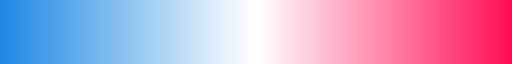

In [ ]:
from shap.plots import colors
from shap.plots._utils import convert_color
blue_white_red =colors.red_transparent_blue
convert_color(blue_white_red)

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


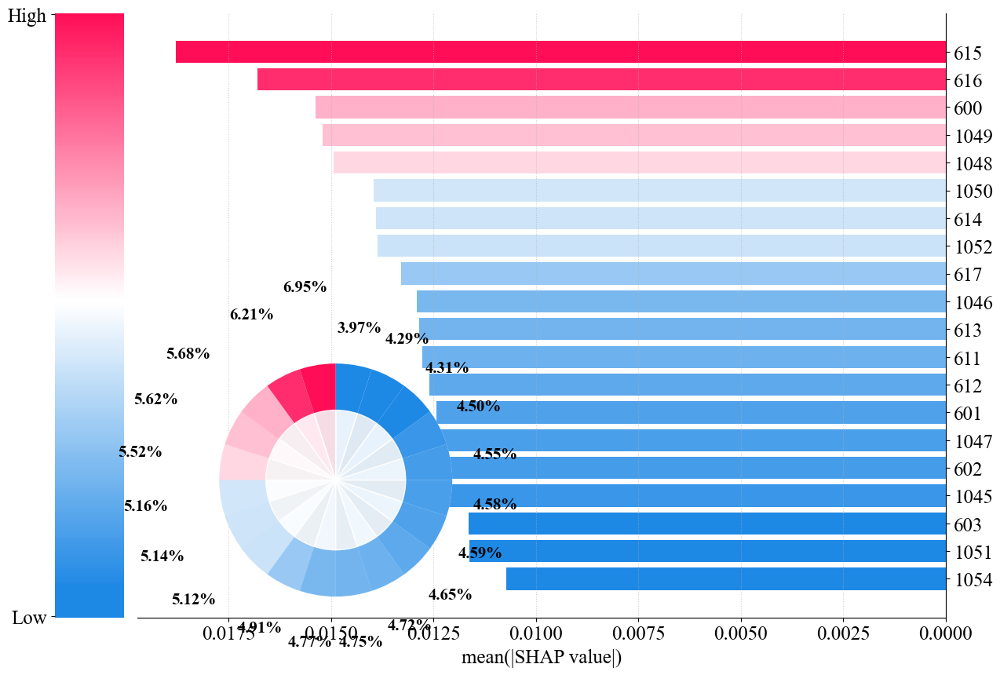

In [ ]:
plt.rcParams["font.family"] = "Times New Roman"
# 绘制图表
top_20_feature_names = sorted_feature_names[:20]
top_20_shap_values = sorted_shap_values[:20]
# 绘制夜莺玫瑰图和条形图
fig, (ax_rose, ax_bars, ax_cbar) = plot_nightingale_rose_with_bars(top_20_feature_names, top_20_shap_values)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
# 特征标签
labels = columns

# 设置 matplotlib 的全局字体配置
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['axes.unicode_minus'] = False

# 提取每个类别的 SHAP 值
shap_values_class_1 = shap_values[0].reshape(-1,3401)
shap_values_class_2 = shap_values[1].reshape(-1,3401)
shap_values_class_3 = shap_values[2].reshape(-1,3401)


import matplotlib.pyplot as plt
import shap
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable

# 创建主图（用来画蜂巢图）
fig, ax1 = plt.subplots(figsize=(10, 8), dpi=1200)

# 计算每个特征的平均SHAP值
mean_shap_values = np.abs(shap_values_class_2).mean(0)
total_importance = mean_shap_values.sum()
percentages = (mean_shap_values / total_importance) * 100

# 创建特征名称和对应的数值
feature_importance_data = list(zip(columns, mean_shap_values, percentages))
# 按重要性排序
feature_importance_data.sort(key=lambda x: x[1], reverse=True)

# 绘制蜂巢图
shap.summary_plot(shap_values_class_2, X_test_.values.reshape(-1,3401), columns, plot_type="dot", show=False, color_bar=True,cmap='bwr')
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 调整图表位置，留出右侧空间



ax1 = plt.gca()

fig = plt.gcf()  # 获取当前Figure
ax_cbar = fig.axes[-1]  # 获取最后一个轴（颜色条）


# 创建共享 y 轴的另一个图，绘制特征贡献图在顶部x轴
ax2 = ax1.twiny()
shap.summary_plot(shap_values_class_2, X_test_.values.reshape(-1,3401), columns, plot_type="bar", show=False,color='black')
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 调整图表位置，与蜂巢图对齐

# 在顶部 X 轴添加一条横线
y_max = len(columns)
ax2.axhline(y=20, color='gray', linestyle='-', linewidth=1)

# 调整透明度
bars = ax2.patches  # 获取所有的柱状图对象
for bar in bars:
    bar.set_alpha(0.2)  # 设置透明度

# 移动顶部的 X 轴，避免与底部 X 轴重叠
ax2.xaxis.set_label_position('top')  # 将标签移动到顶部
ax2.xaxis.tick_top()  # 将刻度也移动到顶部

ax2.set_xlabel('Mean Shapley Value (Feature Importance)', fontsize=12)
# 在右侧添加平均SHAP值和百分比文本（按重要性排序）
# 获取当前图中特征的顺序（从上到下）
current_y_labels = [tick.get_text() for tick in ax1.get_yticklabels()]

# 为每个位置添加对应的数值和百分比
for i, feature_name in enumerate(current_y_labels):
    # 找到该特征在排序后数据中的信息
    feature_data = next((item for item in feature_importance_data if item[0] == feature_name), None)
    if feature_data:
        feature, mean_val, percentage = feature_data
        y_pos = i  # 当前特征在图中的y位置
        
        # 分别绘制SHAP值（蓝色）和百分比（红色）
        # 绘制SHAP值（蓝色）
        ax1.text(ax1.get_xlim()[1] * 0.95, y_pos + 0.18, f'{mean_val:.4f}', 
                 verticalalignment='center', fontsize=8, color='blue')
        
        # 绘制百分比（红色）
        ax1.text(ax1.get_xlim()[1] * 0.95, y_pos - 0.18, f'{percentage:.3f}%', 
                 verticalalignment='center', fontsize=8, color='red')
# 设置y轴标签
ax1.set_ylabel('Feature', fontsize=12)
plt.grid(False)
plt.tight_layout() 


# 保存图片
plt.savefig("SHAP_combined_with_values_and_percentages1.png", format='png', bbox_inches='tight', dpi=300)
plt.show()

# 打印特征重要性排序
print("\n特征重要性排序：")
print("特征名\t\t平均SHAP值\t百分比")
print("-" * 40)
for feature, mean_val, percentage in feature_importance_data:
    print(f"{feature}\t\t{mean_val:.4f}\t\t{percentage:.3f}%")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



特征重要性排序：
特征名		平均SHAP值	百分比
----------------------------------------
615		0.0345		0.856%
600		0.0340		0.844%
601		0.0309		0.766%
611		0.0307		0.763%
616		0.0307		0.762%
614		0.0280		0.694%
613		0.0271		0.674%
610		0.0270		0.669%
609		0.0260		0.645%
612		0.0259		0.642%
618		0.0255		0.632%
617		0.0253		0.629%
602		0.0251		0.623%
607		0.0251		0.623%
608		0.0240		0.596%
603		0.0238		0.591%
620		0.0233		0.577%
606		0.0211		0.524%
605		0.0211		0.524%
604		0.0207		0.513%
619		0.0194		0.481%
621		0.0191		0.473%
627		0.0190		0.473%
626		0.0184		0.456%
636		0.0176		0.438%
628		0.0152		0.377%
622		0.0146		0.364%
629		0.0144		0.358%
634		0.0144		0.357%
625		0.0143		0.354%
992		0.0140		0.347%
642		0.0138		0.344%
635		0.0136		0.337%
633		0.0135		0.334%
632		0.0133		0.330%
643		0.0130		0.323%
630		0.0128		0.318%
631		0.0126		0.312%
624		0.0125		0.310%
637		0.0122		0.303%
641		0.0121		0.300%
644		0.0119		0.296%
990		0.0118		0.294%
623		0.0118		0.293%
638		0.0116		0.289%
991		0.0116		0.287%
1049		0.0115

In [ ]:
import matplotlib.pyplot as plt
# 特征标签
labels = columns

# 设置 matplotlib 的全局字体配置
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['axes.unicode_minus'] = False

# 提取每个类别的 SHAP 值
shap_values_class_1 = shap_values[0].reshape(-1,3401)
shap_values_class_2 = shap_values[1].reshape(-1,3401)
shap_values_class_3 = shap_values[2].reshape(-1,3401)


import matplotlib.pyplot as plt
import shap
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable

# 创建主图（用来画蜂巢图）
fig, ax1 = plt.subplots(figsize=(10, 8), dpi=1200)

# 计算每个特征的平均SHAP值
mean_shap_values = np.abs(shap_values_class_3).mean(0)
total_importance = mean_shap_values.sum()
percentages = (mean_shap_values / total_importance) * 100

# 创建特征名称和对应的数值
feature_importance_data = list(zip(columns, mean_shap_values, percentages))
# 按重要性排序
feature_importance_data.sort(key=lambda x: x[1], reverse=True)

# 绘制蜂巢图
shap.summary_plot(shap_values_class_3, X_test_.values.reshape(-1,3401), columns, plot_type="dot", show=False, color_bar=True,cmap='bwr')
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 调整图表位置，留出右侧空间



ax1 = plt.gca()

fig = plt.gcf()  # 获取当前Figure
ax_cbar = fig.axes[-1]  # 获取最后一个轴（颜色条）


# 创建共享 y 轴的另一个图，绘制特征贡献图在顶部x轴
ax2 = ax1.twiny()
shap.summary_plot(shap_values_class_3, X_test_.values.reshape(-1,3401), columns, plot_type="bar", show=False,color='black')
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 调整图表位置，与蜂巢图对齐

# 在顶部 X 轴添加一条横线
y_max = len(columns)
ax2.axhline(y=20, color='gray', linestyle='-', linewidth=1)

# 调整透明度
bars = ax2.patches  # 获取所有的柱状图对象
for bar in bars:
    bar.set_alpha(0.2)  # 设置透明度

# 移动顶部的 X 轴，避免与底部 X 轴重叠
ax2.xaxis.set_label_position('top')  # 将标签移动到顶部
ax2.xaxis.tick_top()  # 将刻度也移动到顶部

ax2.set_xlabel('Mean Shapley Value (Feature Importance)', fontsize=12)
# 在右侧添加平均SHAP值和百分比文本（按重要性排序）
# 获取当前图中特征的顺序（从上到下）
current_y_labels = [tick.get_text() for tick in ax1.get_yticklabels()]

# 为每个位置添加对应的数值和百分比
for i, feature_name in enumerate(current_y_labels):
    # 找到该特征在排序后数据中的信息
    feature_data = next((item for item in feature_importance_data if item[0] == feature_name), None)
    if feature_data:
        feature, mean_val, percentage = feature_data
        y_pos = i  # 当前特征在图中的y位置
        
        # 分别绘制SHAP值（蓝色）和百分比（红色）
        # 绘制SHAP值（蓝色）
        ax1.text(ax1.get_xlim()[1] * 0.95, y_pos + 0.18, f'{mean_val:.4f}', 
                 verticalalignment='center', fontsize=8, color='blue')
        
        # 绘制百分比（红色）
        ax1.text(ax1.get_xlim()[1] * 0.95, y_pos - 0.18, f'{percentage:.3f}%', 
                 verticalalignment='center', fontsize=8, color='red')
# 设置y轴标签
ax1.set_ylabel('Feature', fontsize=12)
plt.grid(False)
plt.tight_layout() 


# 保存图片
plt.savefig("SHAP_combined_with_values_and_percentages3.png", format='png', bbox_inches='tight', dpi=300)
plt.show()

# 打印特征重要性排序
print("\n特征重要性排序：")
print("特征名\t\t平均SHAP值\t百分比")
print("-" * 40)
for feature, mean_val, percentage in feature_importance_data:
    print(f"{feature}\t\t{mean_val:.4f}\t\t{percentage:.3f}%")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



特征重要性排序：
特征名		平均SHAP值	百分比
----------------------------------------
992		0.0221		0.721%
993		0.0202		0.660%
991		0.0202		0.660%
994		0.0192		0.625%
990		0.0181		0.592%
989		0.0171		0.558%
995		0.0166		0.543%
996		0.0148		0.482%
611		0.0144		0.470%
997		0.0139		0.452%
600		0.0135		0.439%
607		0.0131		0.429%
601		0.0128		0.417%
998		0.0127		0.414%
615		0.0126		0.410%
602		0.0123		0.401%
609		0.0115		0.375%
999		0.0114		0.371%
614		0.0113		0.367%
618		0.0111		0.364%
610		0.0110		0.358%
616		0.0110		0.358%
608		0.0109		0.357%
1002		0.0109		0.357%
613		0.0108		0.353%
612		0.0108		0.352%
605		0.0107		0.349%
1000		0.0105		0.343%
1007		0.0103		0.335%
617		0.0096		0.312%
988		0.0095		0.309%
606		0.0094		0.308%
1005		0.0092		0.299%
1001		0.0090		0.295%
1038		0.0089		0.291%
604		0.0089		0.291%
1003		0.0089		0.290%
1006		0.0086		0.280%
1004		0.0080		0.262%
2926		0.0077		0.251%
619		0.0076		0.249%
987		0.0076		0.248%
2927		0.0074		0.242%
700		0.0072		0.234%
620		0.0071		0.230%
1009		0.0070		0.230%


In [ ]:
shap_values_=[shap_values[0].reshape(-1,3401),shap_values[1].reshape(-1,3401),shap_values[2].reshape(-1,3401)]


In [ ]:
# 绘制SHAP值总结图（Summary Plot）
plt.figure(figsize=(10, 5), dpi=1200)
shap.summary_plot(shap_values_, X_test_, plot_type="bar", class_names=['ARM','PER','PRU' ],show=False)
plt.tight_layout()
plt.show()